In [19]:
import requests

url = "https://cs.stanford.edu/people/karpathy/char-rnn/linux_input.txt"
resp = requests.get(url)
resp.raise_for_status()

text_data = resp.text
print(text_data[:500])


/*
 * linux/kernel/irq/autoprobe.c
 *
 * Copyright (C) 1992, 1998-2004 Linus Torvalds, Ingo Molnar
 *
 * This file contains the interrupt probing code and driver APIs.
 */

#include <linux/irq.h>
#include <linux/module.h>
#include <linux/interrupt.h>
#include <linux/delay.h>
#include <linux/async.h>

#include "internals.h"

/*
 * Autodetection depends on the fact that any interrupt that
 * comes in on to an unassigned handler will get stuck with
 * "IRQS_WAITING" cleared and the interrupt disabl


In [20]:
# 1. Pre-process the text: lowercase and split into words
words = text_data.lower().split()


In [21]:
print(words)


['/*', '*', 'linux/kernel/irq/autoprobe.c', '*', '*', 'copyright', '(c)', '1992,', '1998-2004', 'linus', 'torvalds,', 'ingo', 'molnar', '*', '*', 'this', 'file', 'contains', 'the', 'interrupt', 'probing', 'code', 'and', 'driver', 'apis.', '*/', '#include', '<linux/irq.h>', '#include', '<linux/module.h>', '#include', '<linux/interrupt.h>', '#include', '<linux/delay.h>', '#include', '<linux/async.h>', '#include', '"internals.h"', '/*', '*', 'autodetection', 'depends', 'on', 'the', 'fact', 'that', 'any', 'interrupt', 'that', '*', 'comes', 'in', 'on', 'to', 'an', 'unassigned', 'handler', 'will', 'get', 'stuck', 'with', '*', '"irqs_waiting"', 'cleared', 'and', 'the', 'interrupt', 'disabled.', '*/', 'static', 'define_mutex(probing_active);', '/**', '*', 'probe_irq_on', '-', 'begin', 'an', 'interrupt', 'autodetect', '*', '*', 'commence', 'probing', 'for', 'an', 'interrupt.', 'the', 'interrupts', 'are', 'scanned', '*', 'and', 'a', 'mask', 'of', 'potential', 'interrupt', 'lines', 'is', 'returne

In [22]:
len(words)

759639

In [23]:
# 2. Get all unique words
unique_words = sorted(list(set(words)))
unique_words


['!',
 '!!',
 '!!(attr->sched_flags',
 '!!(caps.magic_etc',
 '!!(file->flags',
 '!!(flags',
 '!!(func_flags.val',
 '!!(iter->flags',
 '!!(kprobe_gone(&tk->rp.kp));',
 '!!(me->mm->def_flags',
 '!!(rnp->qsmask',
 '!!(tp->flags',
 '!!(trace_flags',
 '!!(vcaps.magic_etc',
 '!!(wo->wo_flags',
 '!!access_once(rdp->nxtlist),',
 '!!arg2;',
 '!!arg;',
 '!!audit_default;',
 '!!child_event->parent);',
 '!!enabled)',
 '!!enabled))',
 '!!field->is_signed);',
 '!!ftrace_enabled))',
 '!!ftrace_enabled;',
 '!!ftrace_lookup_ip(hash,',
 '!!ftrace_lookup_ip(new_hash,',
 '!!ftrace_lookup_ip(old_hash,',
 '!!ftrace_lookup_ip(other_hash,',
 '!!get_symbol_pos(addr,',
 '!!hardirqs_off;',
 '!!hlock->read]++;',
 '!!initcall_debug;',
 '!!kexec_crash_image);',
 '!!kexec_image);',
 '!!list,',
 '!!match',
 '!!module_address_lookup(addr,',
 '!!n;',
 '!!new;',
 '!!new_feature,',
 '!!new_lock,',
 '!!nr_pages;',
 '!!old_feature,',
 '!!old_lock,',
 '!!q->blk_trace);',
 '!!rb->aux_nr_pages;',
 '!!ret;',
 '!!rnp->gp_tasks)

In [24]:
len(unique_words)

111118

In [25]:
word_counts = {}
for w in words:
  if w in word_counts.keys():
    word_counts[w] = word_counts[w] + 1
  else:
    word_counts[w] = 1

In [26]:
print(word_counts)

{'/*': 12190, '*': 33504, 'linux/kernel/irq/autoprobe.c': 1, 'copyright': 324, '(c)': 302, '1992,': 9, '1998-2004': 3, 'linus': 26, 'torvalds,': 9, 'ingo': 81, 'molnar': 69, 'this': 3451, 'file': 610, 'contains': 93, 'the': 17488, 'interrupt': 418, 'probing': 9, 'code': 332, 'and': 3890, 'driver': 46, 'apis.': 1, '*/': 13445, '#include': 2978, '<linux/irq.h>': 15, '<linux/module.h>': 87, '<linux/interrupt.h>': 53, '<linux/delay.h>': 34, '<linux/async.h>': 5, '"internals.h"': 12, 'autodetection': 2, 'depends': 16, 'on': 1903, 'fact': 32, 'that': 2309, 'any': 709, 'comes': 22, 'in': 3235, 'to': 8360, 'an': 985, 'unassigned': 3, 'handler': 182, 'will': 1127, 'get': 402, 'stuck': 17, 'with': 1502, '"irqs_waiting"': 1, 'cleared': 32, 'disabled.': 95, 'static': 8051, 'define_mutex(probing_active);': 1, '/**': 1275, 'probe_irq_on': 1, '-': 3157, 'begin': 10, 'autodetect': 4, 'commence': 1, 'for': 4466, 'interrupt.': 23, 'interrupts': 209, 'are': 1529, 'scanned': 2, 'a': 4959, 'mask': 169, 'of

In [27]:
top_10 = dict(sorted(word_counts.items(), key=lambda item: item[1], reverse=True)[:10])
print(top_10)

least_10 = dict(sorted(word_counts.items(), key=lambda item: item[1], reverse=False)[:10])
print(least_10)

{'*': 33504, '=': 28003, 'if': 18989, '{': 18915, 'the': 17488, '}': 16965, '*/': 13445, '/*': 12190, 'struct': 10997, 'return': 10274}
{'linux/kernel/irq/autoprobe.c': 1, 'apis.': 1, '"irqs_waiting"': 1, 'define_mutex(probing_active);': 1, 'probe_irq_on': 1, 'commence': 1, 'probe_irq_on(void)': 1, 'mutex_lock(&probing_active);': 1, '(desc->irq_data.chip->irq_set_type)': 1, 'desc->irq_data.chip->irq_set_type(&desc->irq_data,': 1}


In [28]:
import re
from collections import deque

# ---------- CONFIG ----------
window_size = 3
pad_token = '.'      # token used for padding display at paragraph start
# ----------------------------

# Split into paragraphs on one or more blank lines
paragraphs = re.split(r'(?:\n\s*\n+|[.?!]\s{3,})', text_data.strip())

# containers for all pairs
X = []
y = []

for para in paragraphs:
    # normalize paragraph internals
    para = para.replace('\n', ' ')
    # make '.' a separate token so "woman." -> "woman ."
    para = re.sub(r'([.])', r' \1 ', para)
    para = re.sub(r'\s+', ' ', para).strip()
    if not para:
        continue

    words = para.split()

    # Initialize context with pads at the *start of each paragraph*
    context = deque([pad_token] * window_size, maxlen=window_size)

    # For each token in this paragraph, create (context, token) pair
    for word in words:
        X.append(list(context))
        y.append(word)
        context.append(word)

    # After finishing this paragraph, reset context for the next paragraph
    # (This ensures the next paragraph starts with pad_token context)
    context = deque([pad_token] * window_size, maxlen=window_size)

# --- PRINTING: only show ". . . . . ---> word" for actual paragraph starts ---
# When the stored X for a pair is ALL pad_token, that pair is the first pair
# of a paragraph (because we initialized context to pads at paragraph start).

max = 500
for xi, yi in zip(X, y):
    max -= 1
    if max < 0:
        break
    if all(tok == pad_token for tok in xi):
        # Paragraph-start: show pads separated by space like ". . . . . ---> word"
        print(' '.join(xi), "--->", yi)
    else:
        # Normal context display in bracket form [a,b,c] ---> y (no spaces after commas)
        print(f"[{','.join(xi)}] ---> {yi}")

. . . ---> /*
[.,.,/*] ---> *
[.,/*,*] ---> linux/kernel/irq/autoprobe
[/*,*,linux/kernel/irq/autoprobe] ---> .
[*,linux/kernel/irq/autoprobe,.] ---> c
[linux/kernel/irq/autoprobe,.,c] ---> *
[.,c,*] ---> *
[c,*,*] ---> Copyright
[*,*,Copyright] ---> (C)
[*,Copyright,(C)] ---> 1992,
[Copyright,(C),1992,] ---> 1998-2004
[(C),1992,,1998-2004] ---> Linus
[1992,,1998-2004,Linus] ---> Torvalds,
[1998-2004,Linus,Torvalds,] ---> Ingo
[Linus,Torvalds,,Ingo] ---> Molnar
[Torvalds,,Ingo,Molnar] ---> *
[Ingo,Molnar,*] ---> *
[Molnar,*,*] ---> This
[*,*,This] ---> file
[*,This,file] ---> contains
[This,file,contains] ---> the
[file,contains,the] ---> interrupt
[contains,the,interrupt] ---> probing
[the,interrupt,probing] ---> code
[interrupt,probing,code] ---> and
[probing,code,and] ---> driver
[code,and,driver] ---> APIs
[and,driver,APIs] ---> .
[driver,APIs,.] ---> */
. . . ---> #include
[.,.,#include] ---> <linux/irq
[.,#include,<linux/irq] ---> .
[#include,<linux/irq,.] ---> h>
[<linux/irq,.,h

**Creating the dataset**

In [29]:
# Recreate unique_words, all_words, stoi, and itos from X and y to ensure vocabulary consistency
all_words_in_xy = sorted(list(set([w for context in X for w in context] + y)))
special_tokens = ['<PAD>', '<UNK>', '<BOS>', '<EOS>']
all_words = special_tokens + all_words_in_xy

# Create the mapping from words to integers and vice versa
stoi = {w: i for i, w in enumerate(all_words)}
itos = {i: w for i, w in enumerate(all_words)}

# Convert the text data to integer indices
X_idx = [[stoi.get(w, stoi['<UNK>']) for w in context] for context in X]
y_idx = [stoi.get(word, stoi['<UNK>']) for word in y]

# Print some examples to verify
print("Original X:", X[:5])
print("X_idx:", X_idx[:5])
print("Original y:", y[:5])
print("y_idx:", y_idx[:5])
print("stoi size:", len(stoi))

Original X: [['.', '.', '.'], ['.', '.', '/*'], ['.', '/*', '*'], ['/*', '*', 'linux/kernel/irq/autoprobe'], ['*', 'linux/kernel/irq/autoprobe', '.']]
X_idx: [[22646, 22646, 22646], [22646, 22646, 22648], [22646, 22648, 17327], [22648, 17327, 71905], [17327, 71905, 22646]]
Original y: ['/*', '*', 'linux/kernel/irq/autoprobe', '.', 'c']
y_idx: [22648, 17327, 71905, 22646, 47794]
stoi size: 109239


In [30]:
import torch
from torch.utils.data import Dataset, DataLoader

class WordContextDataset(Dataset):
    def __init__(self, X_list, y_list):
        self.X = X_list
        self.y = y_list

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        # Convert to tensor on-the-fly
        X_tensor = torch.tensor(self.X[idx], dtype=torch.long)
        y_tensor = torch.tensor(self.y[idx], dtype=torch.long)
        return X_tensor, y_tensor


In [31]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'


In [32]:
from torch.utils.data import random_split
import numpy as np

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_idx, y_idx, test_size=0.2, random_state=42, shuffle=True
)

train_ds = WordContextDataset(X_train, y_train)
val_ds = WordContextDataset(X_test, y_test)

train_loader = DataLoader(train_ds, batch_size=128, shuffle=True, drop_last=True)
val_loader = DataLoader(val_ds, batch_size=128, shuffle=False)

In [33]:
train_ds[0]

(tensor([43356, 93436, 28057]), tensor(44044))

**Model Design and Training**

In [34]:
import torch
import torch.nn as nn
from tqdm import tqdm

In [35]:
class MLP(nn.Module):
  def __init__(self, vocab_size, embedding_dim, context_length, hidden_dim, activation_fn):
    super().__init__()
    self.embedding = nn.Embedding(vocab_size, embedding_dim)
    input_dim = embedding_dim*context_length
    self.l1 = nn.Linear(input_dim, hidden_dim)
    self.bn1 = nn.BatchNorm1d(hidden_dim)
    self.l2 = nn.Linear(hidden_dim, hidden_dim)
    self.bn2 = nn.BatchNorm1d(hidden_dim)
    self.l3 = nn.Linear(hidden_dim,vocab_size)
    self.act = activation_fn
    self.dropout = nn.Dropout(0.7)

  def forward(self, x):
    emb = self.embedding(x)
    emb_flat = emb.view(emb.size(0), -1)
    h1 = self.act(self.bn1(self.l1(emb_flat)))
    h2 = self.act(self.bn2(self.l2(h1)))
    h1 = self.dropout(h1)
    h2 = self.dropout(h2)
    h2 = h2 + h1
    logits = self.l3(h2)
    return logits


In [36]:
vocab_size = len(stoi)
model = MLP(vocab_size = vocab_size, embedding_dim = 64, context_length = 3, hidden_dim=512, activation_fn=nn.ReLU())
model = model.to(device)

In [37]:
criterion = torch.nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-3,          # start around 1e-3 or 5e-4
    weight_decay=5e-3 # helps prevent overfitting
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',      # minimize validation loss
    factor=0.7,      # reduce lr by 0.7x
    patience=3,      # after 2 epochs of no improvement
)

In [38]:
import numpy as np

train_losses, val_losses = [], []

# --- Variables for Early Stopping ---
best_val_loss = np.inf
patience = 5  # Number of epochs to wait after last improvement
patience_counter = 0
# ------------------------------------

# Train for a large number of epochs; early stopping will find the best one.
for epoch in range(500):
    model.train()
    running_loss = 0.0
    batch_count = 0

    for xb, yb in train_loader:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad()
        logits = model(xb)
        loss = criterion(logits, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.1)
        optimizer.step()

        running_loss += loss.item()
        batch_count += 1

    avg_train_loss = running_loss / batch_count
    train_losses.append(avg_train_loss)

    # -------------------- Validation --------------------
    model.eval()
    val_loss_sum = 0.0
    val_count = 0
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            logits = model(xb)
            loss = criterion(logits, yb)
            val_loss_sum += loss.item() * xb.size(0)
            val_count += xb.size(0)

    avg_val_loss = val_loss_sum / val_count
    val_losses.append(avg_val_loss)

    # Scheduler step
    scheduler.step(avg_val_loss)

    current_lr = optimizer.param_groups[0]['lr']
    print(f"Epoch {epoch:03d} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | LR: {current_lr:.1e}")

    # --- Early Stopping and Model Saving Logic ---
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0  # Reset patience counter
        # Save the best model
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"  -> New best val loss. Model saved to 'best_model.pth'")
    else:
        patience_counter += 1
        print(f"  -> Val loss did not improve. Patience: {patience_counter}/{patience}")
        if patience_counter >= patience:
            print(f"  -> EARLY STOPPING. Best val loss was: {best_val_loss:.4f}")
            break # Exit the training loop

print("\nTraining finished.")


Epoch 000 | Train Loss: 7.9999 | Val Loss: 7.4074 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 001 | Train Loss: 7.3521 | Val Loss: 7.0898 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 002 | Train Loss: 6.9703 | Val Loss: 6.9207 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 003 | Train Loss: 6.7008 | Val Loss: 6.7990 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 004 | Train Loss: 6.4999 | Val Loss: 6.7305 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 005 | Train Loss: 6.3330 | Val Loss: 6.6648 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 006 | Train Loss: 6.1934 | Val Loss: 6.6244 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 007 | Train Loss: 6.0651 | Val Loss: 6.5932 | LR: 1.0e-03
  -> New best val loss. Model saved to 'best_model.pth'
Epoch 008 | Train Loss: 5.9493 | Val Los

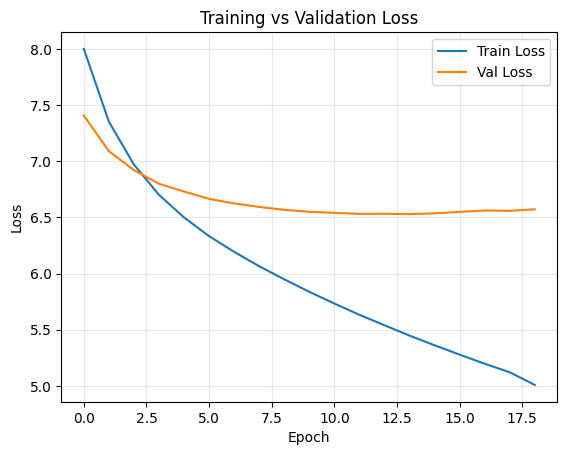

In [39]:
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [40]:
len(X_train), len(X_test), len(y_train), len(y_test), len(X), len(y)

(636559, 159140, 636559, 159140, 795699, 795699)

In [41]:
import torch
import torch.nn.functional as F

def predict_next_word(model, sentence, stoi, itos, context_length=3, device='cuda'):
    """
    Predicts the next word given a model and a sentence.

    Args:
        model: Your trained MLP model.
        sentence: A string (e.g., "he said to")
        stoi: Your string-to-index vocabulary map.
        itos: Your index-to-string vocabulary map.
        context_length: The context size your model was trained on (3).
        device: The device your model is on ('cuda' or 'cpu').
    """

    # 1. Set model to evaluation mode (disables dropout, etc.)
    model.eval()

    # 2. Process the input sentence
    words = sentence.lower().split()

    # 3. Get the last 'context_length' words
    if len(words) < context_length:
        raise ValueError(f"Sentence must be at least {context_length} words long.")

    context_words = words[-context_length:]

    # 4. Convert words to indices, handling unknown words
    # Use stoi.get(word, stoi['<UNK>']) to avoid errors
    indices = [stoi.get(w, stoi['<UNK>']) for w in context_words]

    # 5. Convert indices to the correct tensor shape
    # (batch_size=1, context_length)
    xb = torch.tensor(indices, dtype=torch.long).unsqueeze(0).to(device)

    # 6. Get predictions
    with torch.no_grad(): # No need to track gradients for prediction
        logits = model(xb)

    # 7. Get the index of the most likely next word
    # torch.argmax finds the index with the highest logit value
    pred_index = torch.argmax(logits, dim=1).item()

    # 8. Convert the index back to a word
    predicted_word = itos[pred_index]

    return predicted_word



In [42]:
# --- This is a new cell ---

# 1. Make sure your model (the class MLP) is defined
# (It is already defined in Cell 40 of your notebook)

# 2. Load the best weights you saved during training
# We use the model from 'best_model.pth' which had the lowest validation loss
try:
    model.load_state_dict(torch.load('best_model.pth'))
    model = model.to(device) # Ensure model is on the correct device
    print("Successfully loaded 'best_model.pth'")
except Exception as e:
    print(f"Error loading model: {e}")
    print("--- PLEASE ENSURE YOU HAVE RUN THE TRAINING LOOP THAT SAVES 'best_model.pth' ---")

context_length = 3
# 3. Define some example sentences
# Your context length is 3, so you must provide at least 3 words.
test_sentence_1 = "if the pointer"
test_sentence_2 = "the kernel must"
test_sentence_3 = "this is a bug"


    # --- Example 1 ---
pred_1 = predict_next_word(model, test_sentence_1, stoi, itos, context_length, device)
print(f"Input: '{test_sentence_1}'  ->  Predicted: '{pred_1}'")
print(f"Full sentence: '{test_sentence_1} {pred_1}'")

    # --- Example 2 ---
pred_2 = predict_next_word(model, test_sentence_2, stoi, itos, context_length, device)
print(f"\nInput: '{test_sentence_2}'  ->  Predicted: '{pred_2}'")
print(f"Full sentence: '{test_sentence_2} {pred_2}'")

    # --- Example 3 ---
    # This will use the last 3 words: "to the"
pred_3 = predict_next_word(model, test_sentence_3, stoi, itos, context_length, device)
print(f"\nInput: '{test_sentence_3}'  ->  Predicted: '{pred_3}'")
print(f"Full sentence: '{test_sentence_3} {pred_3}'")



Successfully loaded 'best_model.pth'
Input: 'if the pointer'  ->  Predicted: 'is'
Full sentence: 'if the pointer is'

Input: 'the kernel must'  ->  Predicted: 'be'
Full sentence: 'the kernel must be'

Input: 'this is a bug'  ->  Predicted: '*'
Full sentence: 'this is a bug *'


Successfully loaded 'best_model.pth' onto CPU.
Successfully extracted embedding matrix of shape: (109239, 64)

Finding words in your vocabulary (stoi)...
  - Warning: 'pci' not in vocabulary (stoi). Skipping.

Running t-SNE on 45 word embeddings...


/tmp/ipython-input-899297407.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('tab10', len(word_groups))


t-SNE finished.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


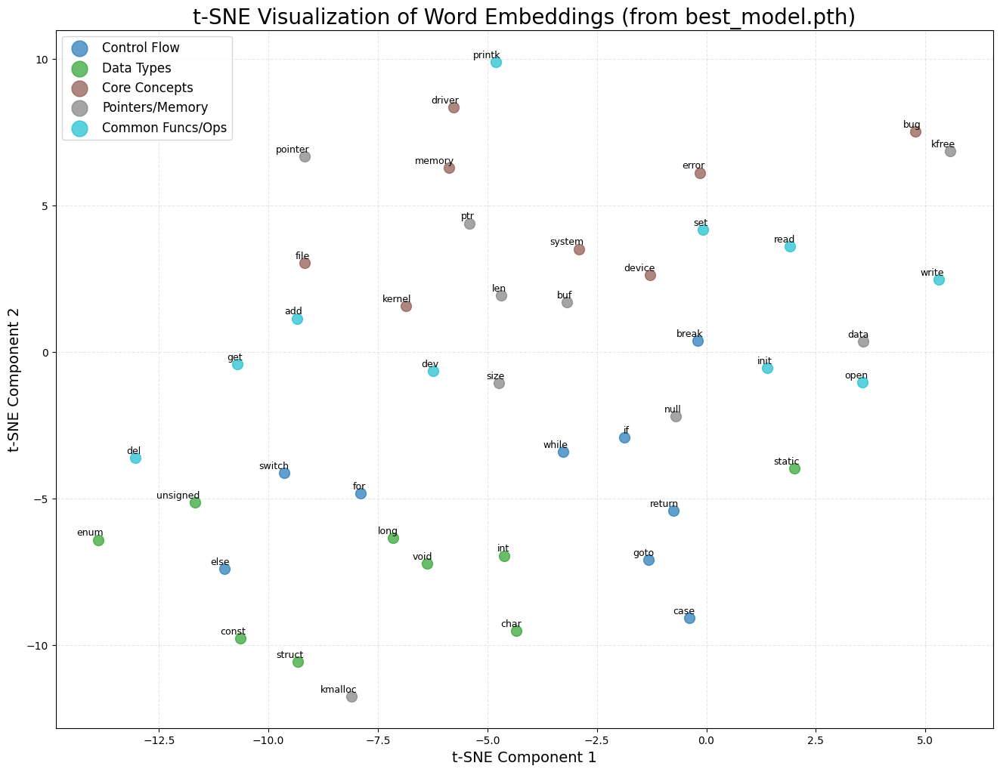

In [43]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import warnings

# --- 1. Load your BEST model ---
# This is the most important step. We load the model you saved
# with the lowest validation loss, NOT the SWA model.

try:
    # Ensure the model is loaded onto the CPU for this
    model.load_state_dict(torch.load('best_model.pth', map_location=torch.device('cpu')))
    model.to('cpu') # Move model to CPU
    model.eval() # Set model to evaluation mode
    print("Successfully loaded 'best_model.pth' onto CPU.")
except Exception as e:
    print(f"Error loading 'best_model.pth': {e}")
    print("Please make sure you have run the training loop that saves 'best_model.pth'")

# --- 2. Setup: Define Word Groups ---
# We will select words from different categories to see if they cluster.
# (Feel free to change these words, but make sure they are in your vocabulary)
# --- New Word Groups for linux_input.txt ---

word_groups = {
    'Control Flow': ['if', 'else', 'for', 'while', 'return', 'break', 'case', 'goto', 'switch'],
    'Data Types': ['void', 'int', 'char', 'long', 'unsigned', 'struct', 'static', 'const', 'enum'],
    'Core Concepts': ['kernel', 'driver', 'memory', 'file', 'system', 'device', 'error', 'bug'],
    'Pointers/Memory': ['pointer', 'ptr', 'null', 'kmalloc', 'kfree', 'size', 'len', 'buf', 'data'],
    'Common Funcs/Ops': ['get', 'set', 'add', 'del', 'init', 'open', 'read', 'write', 'printk', 'dev', 'pci']
}
# --- 3. Extract Target Embeddings ---
# Get the complete embedding matrix from your model's 'embedding' layer
try:
    embedding_matrix = model.embedding.weight.data.cpu().numpy()
    print(f"Successfully extracted embedding matrix of shape: {embedding_matrix.shape}")
except Exception as e:
    print(f"Error: Could not get 'model.embedding.weight.data'.")
    print("Please make sure your model variable is named 'model' and has an 'embedding' layer.")

# Create lists to hold the embeddings and labels for plotting
target_embeddings = []
target_labels = []
target_words = []
target_colors = []

# Map groups to colors
color_map = plt.cm.get_cmap('tab10', len(word_groups))
group_to_color = {group_name: color_map(i) for i, group_name in enumerate(word_groups.keys())}

print("\nFinding words in your vocabulary (stoi)...")
for group_name, words in word_groups.items():
    for word in words:
        if word in stoi:
            # Get the index of the word
            idx = stoi[word]
            # Get the embedding vector for that index
            target_embeddings.append(embedding_matrix[idx])
            # Store the word and its group for plotting
            target_words.append(word)
            target_labels.append(group_name)
            target_colors.append(group_to_color[group_name])
        else:
            print(f"  - Warning: '{word}' not in vocabulary (stoi). Skipping.")

if not target_embeddings:
    print("\nError: No target words were found in the vocabulary. Plotting cannot continue.")
    print("Please check your 'word_groups' list and the 'stoi' dictionary.")
else:
    # Convert list of embeddings to a numpy array
    target_embeddings = np.array(target_embeddings)

    # --- 4. Run t-SNE ---
    # t-SNE is computationally expensive, but our list is small.
    # We use a low perplexity because we have few data points per category.
    print(f"\nRunning t-SNE on {len(target_embeddings)} word embeddings...")

    # Suppress n_iter warning
    warnings.filterwarnings("ignore", ".*n_iter.*")

    tsne = TSNE(n_components=2,
                perplexity=10,  # Good for small datasets/groups
                random_state=42,
                n_iter=2000, # t-SNE default is 1000
                init='pca',
                learning_rate='auto')

    tsne_results = tsne.fit_transform(target_embeddings)
    print("t-SNE finished.")
    warnings.resetwarnings() # Reset warnings

    # --- 5. Plot the Results ---
    plt.figure(figsize=(16, 12))

    # Create a scatter plot for each group to build the legend
    for group_name, color in group_to_color.items():
        # Find the indices for words in this group
        indices = [i for i, label in enumerate(target_labels) if label == group_name]
        if indices:
            # Get the x, y coordinates
            x = tsne_results[indices, 0]
            y = tsne_results[indices, 1]
            plt.scatter(x, y, color=color, label=group_name, alpha=0.7, s=100)

    # Add text labels (annotations) to each point
    for i, word in enumerate(target_words):
        plt.annotate(word,
                     (tsne_results[i, 0], tsne_results[i, 1]),
                     xytext=(5, 2), # Small offset
                     textcoords='offset points',
                     ha='right',
                     va='bottom',
                     fontsize=9)

    plt.title('t-SNE Visualization of Word Embeddings (from best_model.pth)', fontsize=20)
    plt.xlabel('t-SNE Component 1', fontsize=14)
    plt.ylabel('t-SNE Component 2', fontsize=14)
    plt.legend(loc='best', fontsize=12, markerscale=1.5)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()